# Проект

# Рынок заведений общественного питания Москвы

# Описание проекта

Инвесторы из фонда «Shut Up and Take My Money» решили попробовать себя в новой области и открыть заведение общественного питания в Москве. Заказчики ещё не знают, что это будет за место: кафе, ресторан, пиццерия, паб или бар, — и какими будут расположение, меню и цены.

Для начала необходимо подготовить исследование рынка Москвы, найти интересные особенности и презентовать полученные результаты, которые в будущем помогут в выборе подходящего инвесторам места.

Доступен датасет с заведениями общественного питания Москвы, составленный на основе данных сервисов Яндекс Карты и Яндекс Бизнес на лето 2022 года.

# Описание данных

В распоряжении файл `moscow_places.csv` с информацией о заведениях общественного питания Москвы.

Структура данных в файле `moscow_places.csv`:
* name — название заведения;
* address — адрес заведения;
* category — категория заведения, например «кафе», «пиццерия» или «кофейня»;
* hours — информация о днях и часах работы;
* lat — широта географической точки, в которой находится заведение;
* lng — долгота географической точки, в которой находится заведение;
* rating — рейтинг заведения по оценкам пользователей в Яндекс Картах (высшая оценка — 5.0);
* price — категория цен в заведении, например «средние», «ниже среднего», «выше среднего» и так далее;
* avg_bill — строка, которая хранит среднюю стоимость заказа в виде диапазона, например:
  * «Средний счёт: 1000–1500 ₽»;
  * «Цена чашки капучино: 130–220 ₽»;
  * «Цена бокала пива: 400–600 ₽».
  * и так далее;
* middle_avg_bill — число с оценкой среднего чека, которое указано только для значений из столбца avg_bill, начинающихся с подстроки «Средний счёт»:
  * Если в строке указан ценовой диапазон из двух значений, в столбец войдёт медиана этих двух значений.
  * Если в строке указано одно число — цена без диапазона, то в столбец войдёт это число.
  * Если значения нет или оно не начинается с подстроки «Средний счёт», то в столбец ничего не войдёт.
* middle_coffee_cup — число с оценкой одной чашки капучино, которое указано только для значений из столбца avg_bill, начинающихся с подстроки «Цена одной чашки капучино»:
  * Если в строке указан ценовой диапазон из двух значений, в столбец войдёт медиана этих двух значений.
  * Если в строке указано одно число — цена без диапазона, то в столбец войдёт это число.
  * Если значения нет или оно не начинается с подстроки «Цена одной чашки капучино», то в столбец ничего не войдёт.
* chain — число, выраженное 0 или 1, которое показывает, является ли заведение сетевым (для маленьких сетей могут встречаться ошибки):
  * 0 — заведение не является сетевым
  * 1 — заведение является сетевым
* district — административный район, в котором находится заведение, например Центральный административный округ;
* seats — количество посадочных мест.

# Основные этапы проекта

* 1.` `Загрузка данных и изучение общей информации
* 2.` `Подготовка данных к анализу
* 3.` `Исследовательский анализ данных
   * 3.1` `Распределение заведений по категориям
   * 3.2` `Количество посадочных мест в заведениях разных категорий
   * 3.3` `Сетевые и несетевые заведения
   * 3.4` `Топ-15 популярных сетевых заведений
   * 3.5` `Распределение заведений по районам
   * 3.6` `Распределение средних рейтингов по категориям заведений
   * 3.7` `Распределение средних рейтингов по районам
   * 3.8` `Кластеры заведений
   * 3.9` `Топ-15 улиц по количеству заведений
   * 3.10` `Распределение среднего чека по районам
   * 3.11` `Анализ рынка кофеен
* 4.` `Общие выводы и рекомендации

## Загрузка данных и изучение общей информации

In [1]:
pip install folium --quiet

Note: you may need to restart the kernel to use updated packages.



[notice] A new release of pip is available: 23.2.1 -> 23.3.1
[notice] To update, run: python.exe -m pip install --upgrade pip


Импортируем необходимые библиотеки.

In [2]:
import pandas as pd
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns
import plotly.express as px
from plotly import graph_objects as go
import json
from folium import Map, Choropleth, Marker
from folium.plugins import MarkerCluster

Сделаем количество отображемых столбцов таблиц неограниченным.

In [3]:
pd.set_option('display.max_columns', None)

Сделаем длину отобржаемых ячеек таблиц неограниченной.

In [4]:
pd.set_option('display.max_colwidth', None)

Откроем и сохраним данные из файла `moscow_places.csv` в таблицу.

In [5]:
moscow_places = pd.read_csv('moscow_places.csv')

Зададим функцию для определения количества пропусков и их доли в столбцах таблицы.

In [6]:
def nan_values(table):
    nan_count = table.isna().sum()
    nan_percent = round(100 * nan_count / len(table), 2) 
        
    nan_values_table = pd.DataFrame({'Столбец': table.columns, 
                                     'Количество пропусков': nan_count,
                                     'Доля пропусков, %': nan_percent}).reset_index(drop=True)
    return nan_values_table 

Зададим функцию для изучения общей информации, содержащейся в таблице.

In [7]:
def get_table_info(table):
    print('Общая информация о таблице:')
    print()
    display(table.info())
    print('Первые пять строк таблицы:')
    display(table.head())
    print()
    print('Информация о пропусках и дубликатах:')
    display(nan_values(table))
    print()
    print('Количество строк-дубликатов:', table.duplicated().sum())

Получим информацию о данных из таблицы `moscow_places`.

In [8]:
get_table_info(moscow_places)

Общая информация о таблице:

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8406 entries, 0 to 8405
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8406 non-null   object 
 1   category           8406 non-null   object 
 2   address            8406 non-null   object 
 3   district           8406 non-null   object 
 4   hours              7870 non-null   object 
 5   lat                8406 non-null   float64
 6   lng                8406 non-null   float64
 7   rating             8406 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8406 non-null   int64  
 13  seats              4795 non-null   float64
dtypes: float64(6), int64(1), object(7)
memory usage: 919.5+ KB


None

Первые пять строк таблицы:


,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00–02:00",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0



Информация о пропусках и дубликатах:


,Столбец,Количество пропусков,"Доля пропусков, %"
0,name,0,0.00
1,category,0,0.00
2,address,0,0.00
3,district,0,0.00
4,hours,536,6.38
5,lat,0,0.00
6,lng,0,0.00
7,rating,0,0.00
8,price,5091,60.56
9,avg_bill,4590,54.60



Количество строк-дубликатов: 0


Заметно, что в некоторых столбцах присутствуют пропуски. Это столбцы с днями и часами работы, категориями цен, средней стоимостью заказа и количеством посадочных мест. Наибольший интерес для целей исследования представляют пропуски с информацией о среднем чеке. Так как данные в столбцах `middle_avg_bill` и `middle_coffee_cup` зависят от данных в столбце `avg_bill`, можно попробовать восстановить пропуски там, где это возможно сделать. В остальных столбцах пропуски лучше оставить.

Проверим пропуски в столбце `middle_avg_bill`, которые можно восстановить.

In [9]:
moscow_places[(moscow_places['avg_bill'].isna()==False)&
      (moscow_places['avg_bill'].str.contains(r'\Средний счёт'))&
      (moscow_places['middle_avg_bill'].isna()==True)]

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats


Восстановить пропуски в столбце `avg_bill` не получится.

Проверим пропуски в столбце `middle_coffee_cup`, которые можно восстановить.

In [10]:
moscow_places[(moscow_places['avg_bill'].isna()==False)&
      (moscow_places['avg_bill'].str.contains(r'\Цена одной чашки капучино'))&
      (moscow_places['middle_coffee_cup'].isna()==True)]

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats


Восстановить пропуски в столбце `middle_coffee_cup` также не получится.

Получается, что пропуски в столбцах `middle_avg_bill` и `middle_coffee_cup` неслучайны и связаны с данными в столбце `avg_bill`.

Явных строк-дубликатов не обнаружено, но возможно имеются дубликаты по адресу и названию заведения. Проверим это, но сначала приведём названия заведений общественного питания к нижнему регистру.

In [11]:
moscow_places['name'] = moscow_places['name'].str.lower()
moscow_places[moscow_places[['name', 'address']].duplicated()]

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
1511,more poke,ресторан,"Москва, Волоколамское шоссе, 11, стр. 2",Северный административный округ,"пн-чт 09:00–18:00; пт,сб 09:00–21:00; вс 09:00–18:00",55.806307,37.497566,4.2,NaN,NaN,NaN,NaN,1,188.0
2420,раковарня клешни и хвосты,"бар,паб","Москва, проспект Мира, 118",Северо-Восточный административный округ,"пн-чт 12:00–00:00; пт,сб 12:00–01:00; вс 12:00–00:00",55.810677,37.638379,4.4,NaN,NaN,NaN,NaN,1,150.0
3109,хлеб да выпечка,кафе,"Москва, Ярцевская улица, 19",Западный административный округ,NaN,55.738449,37.410937,4.1,NaN,NaN,NaN,NaN,0,276.0


Обнаружено три заведения, имеющих дубликаты по адресу и названию. На этапе подготовки данных к анализу будет необходимо удалить соответствующие строки из таблицы `moscow_places`.

Посмотрим, есть ли заведения, расположенные по одному адресу.

In [12]:
(moscow_places
 .groupby('address')
 ['name'].count()
 .reset_index()
 .rename(columns={'address':'Адрес', 'name':'Количество заведений'})
 .sort_values(by='Количество заведений', ascending=False)
 .reset_index(drop=True)
 .head(10)
)

,Адрес,Количество заведений
0,"Москва, проспект Вернадского, 86В",28
1,"Москва, Усачёва улица, 26",26
2,"Москва, Ярцевская улица, 19",20
3,"Москва, площадь Киевского Вокзала, 2",20
4,"Москва, Каширское шоссе, 61Г",16
5,"Москва, проспект Мира, 211к2",16
6,"Москва, Хорошёвское шоссе, 27",16
7,"Москва, Щёлковское шоссе, вл75",16
8,"Москва, Пресненская набережная, 2",16
9,"Москва, Лесная улица, 20, стр. 3",16


Не удивительно, что таких заведений много. Нередки случаи, когда заведения общественного питания располагаются в крупных торгово-развлекательных центрах, на вокзалах, в гостиницах и отелях или в аэропортах.  

Рассмотрим, в каких районах и в каком количестве располагаются заведения общественного питания.

In [13]:
(moscow_places['district']
 .value_counts()
 .reset_index()
 .rename(columns={'index':'Административный округ','district':'Количество заведений'})
)

,Административный округ,Количество заведений
0,Центральный административный округ,2242
1,Северный административный округ,900
2,Южный административный округ,892
3,Северо-Восточный административный округ,891
4,Западный административный округ,851
5,Восточный административный округ,798
6,Юго-Восточный административный округ,714
7,Юго-Западный административный округ,709
8,Северо-Западный административный округ,409


Все в порядке, заведения располагаются в девяти административных округах Москвы. Отсутствуют разные названия одних и тех-же округов.

Теперь взглянем на распределение заведений общественного питания по их типу.

In [14]:
(moscow_places['category']
 .value_counts()
 .reset_index()
 .rename(columns={'index':'Тип заведения','category':'Количество заведений'})
)

,Тип заведения,Количество заведений
0,кафе,2378
1,ресторан,2043
2,кофейня,1413
3,"бар,паб",765
4,пиццерия,633
5,быстрое питание,603
6,столовая,315
7,булочная,256


В данных представлены заведения общественного питания восьми различных типов. Разные названия одних и тех-же типов отсутствуют.

Займемся поиском аномальных значений в столбцах с числовыми данными. Начнем со столбца с рейтингом заведений.  

Построим гистограмму распределения рейтинга заведений общественного питания.

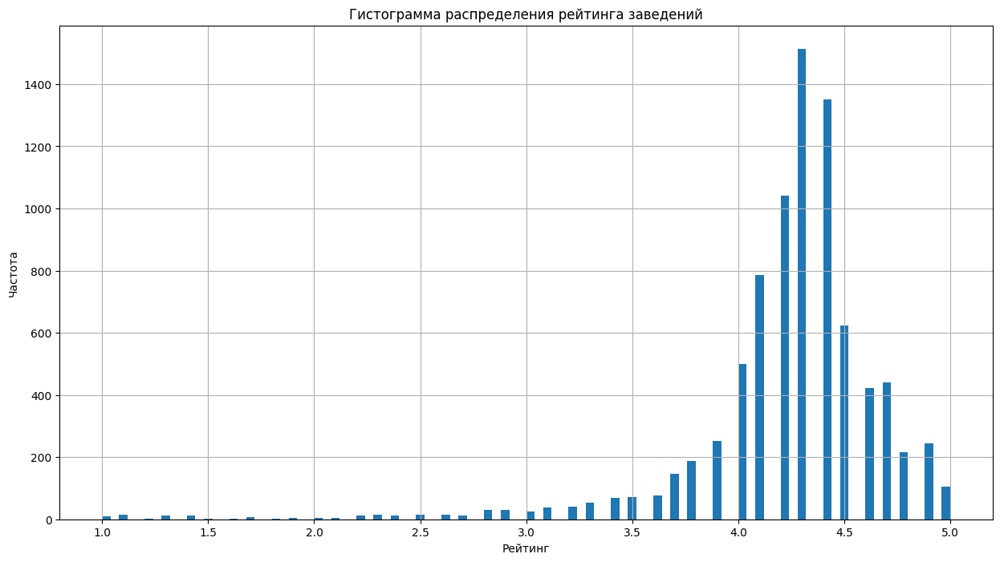

In [15]:
moscow_places['rating'].hist(bins=100,figsize=(15,8));
plt.xlabel('Рейтинг');
plt.ylabel('Частота');
plt.title('Гистограмма распределения рейтинга заведений');

В данных представлены заведения с рейтингом от 1 до 5. С границами все в порядке. Большинство представленных заведений имеют рейтинг больше 3,5, но присутствуют и заведения с очень низким рейтингом.

Перейдем к столбцу с оценкой среднего чека. Построим соответствующую гистограмму.

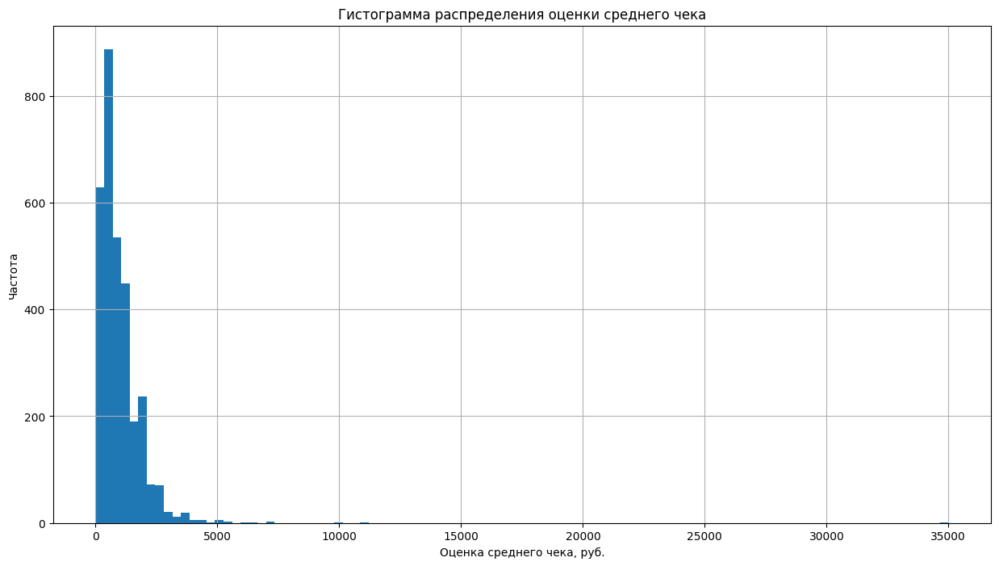

In [16]:
moscow_places['middle_avg_bill'].hist(bins=100,figsize=(15,8));
plt.xlabel('Оценка среднего чека, руб.');
plt.ylabel('Частота');
plt.title('Гистограмма распределения оценки среднего чека');

В данных о среднем чеке явно есть аномально большие значения.

Построим диаграмму размаха для оценки среднего чека.

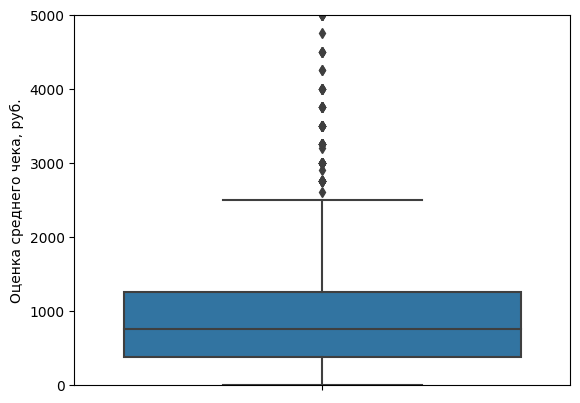

In [17]:
fig1 = sns.boxplot(y=moscow_places['middle_avg_bill'])
fig1.set(ylim=(0,5000));
plt.ylabel('Оценка среднего чека, руб.');

В дальнейшем, на этапе подготовки данных к анализу, необходимо будет удалить из таблицы `moscow_places` заведения с оценкой среднего чека больше 3000 рублей или равных 0.

Рассмотрим теперь столбец с оценкой стоимости одной чашки капучино. Построим соответствующую гистограмму.

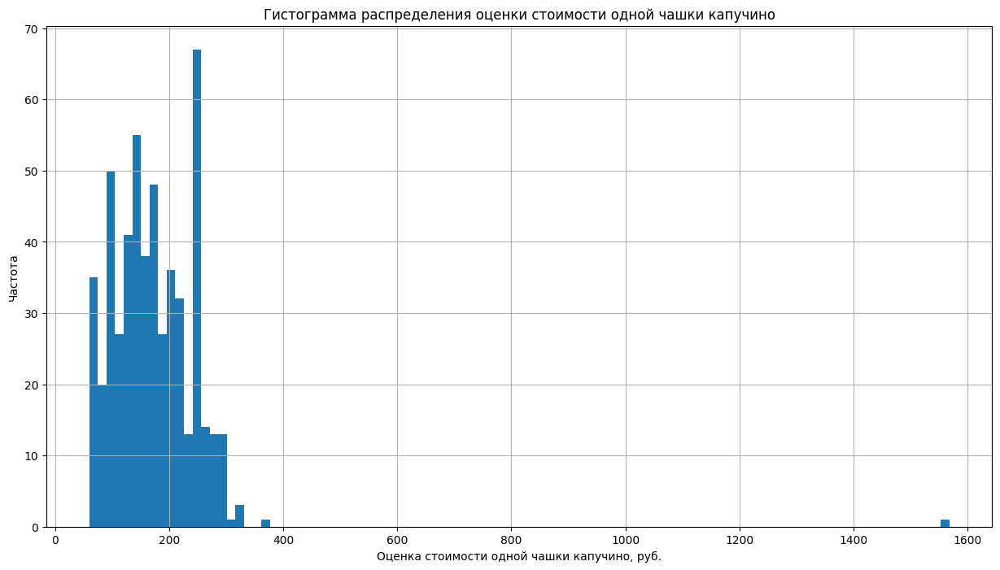

In [18]:
moscow_places['middle_coffee_cup'].hist(bins=100,figsize=(15,8));
plt.xlabel('Оценка стоимости одной чашки капучино, руб.');
plt.ylabel('Частота');
plt.title('Гистограмма распределения оценки стоимости одной чашки капучино');

В данных о стомости одной чашки капучино явно есть аномально большие значения.

Построим диаграмму размаха для оценки стоимости одной чашки капучино.

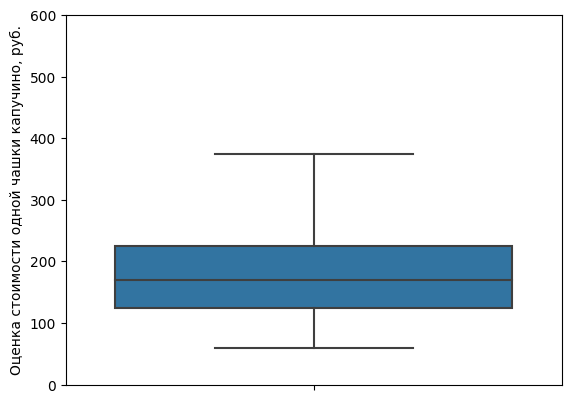

In [19]:
fig2 = sns.boxplot(y=moscow_places['middle_coffee_cup'])
fig2.set(ylim=(0,600));
plt.ylabel('Оценка стоимости одной чашки капучино, руб.');

Посмотрим, в каких заведениях оценка стоимости одной чашки капучино превышает 400 рублей.

In [20]:
moscow_places[moscow_places['middle_coffee_cup'] > 400]

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
2859,шоколадница,кофейня,"Москва, Большая Семёновская улица, 27, корп. 1",Восточный административный округ,"ежедневно, 08:00–23:00",55.782268,37.709022,4.2,средние,Цена чашки капучино:230–2907 ₽,NaN,1568.0,1,48.0


Заметно, что максимальная цена чашки капучино в одной из шоколадниц составляет 2907 рублей. Скорее всего, это опечатка. 2907 рублей на самом деле это 290 рублей.

На этапе подготовки данных к анализу необходимо будет заменить в столбцах `avg_bill` и `middle_coffee_cup` значения на корректные для этого заведения.

Проверим на наличие выбросов столбец с количеством посадочных мест в заведениях. Построим соответствующую гистограмму.

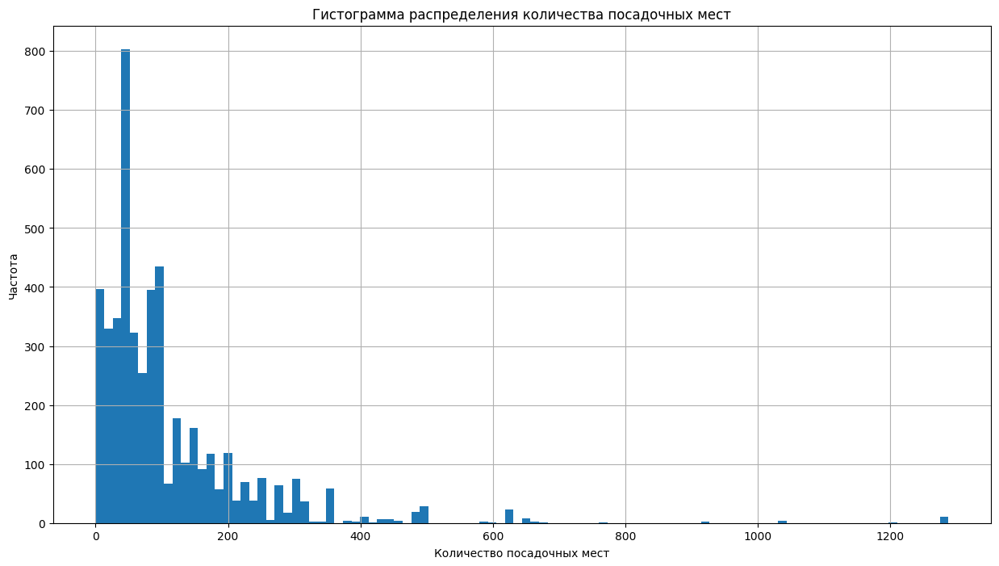

In [21]:
moscow_places['seats'].hist(bins=100,figsize=(15,8));
plt.xlabel('Количество посадочных мест');
plt.ylabel('Частота');
plt.title('Гистограмма распределения количества посадочных мест');

В столбце с количеством посадочных мест в заведениях есть аномально большие значения.

Построим диаграмму размаха для количества посадочных мест.

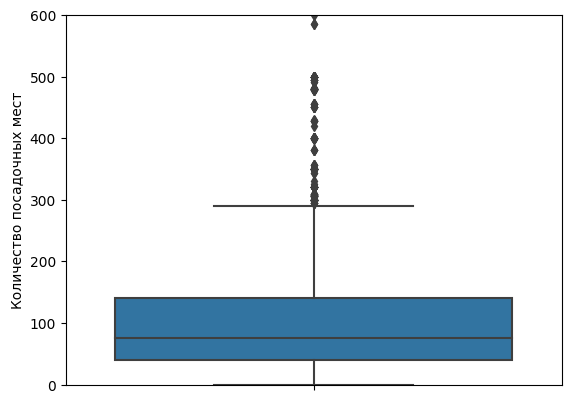

In [22]:
fig3 = sns.boxplot(y=moscow_places['seats'])
fig3.set(ylim=(0,600));
plt.ylabel('Количество посадочных мест');

На этапе подготовки данных к анализу необходимо будет убрать из таблицы `moscow_places` заведения, в которых количество посадочных мест превосходит 300.

**В таблице moscow_places 8406 строк с данными о заведениях общественного питания Москвы. Пропуски в столбцах этой таблицы есть, но заменять или удалять их не нужно. Полных дубликатов нет, однако найдены 3 заведения-дубликата по названию и адресу. В данных представлены заведения восьми различных типов, располагающиеся в девяти административных округах Москвы.**

На этапе подготовки данных к анализу необходимо:
* удалить из таблицы `moscow_places` три заведения-дубликата по названию и адресу;
* удалить из таблицы `moscow_places` заведения с оценкой среднего чека больше 3000 рублей или равных 0;  
* для заведения `Шоколадница`, располагающегося по адресу `Москва, Большая Семёновская улица, 27, корп. 1`, заменить в столбцах `avg_bill` и `middle_coffee_cup` значения на корректные;
* удалить из таблицы `moscow_places` заведения, в которых количество посадочных мест превосходит 300;
* cоздать столбец `street` с названиями улиц из столбца с адресом;
* создать столбец `is_24/7` с обозначением, что заведение работает ежедневно и круглосуточно (24/7):
   * логическое значение True — если заведение работает ежедневно и круглосуточно;
   * логическое значение False — в противоположном случае.

## Подготовка данных к анализу

Удалим из таблицы `moscow_places` три заведения-дубликата по названию и адресу.

In [23]:
moscow_places = moscow_places.drop(index=[1511, 2420, 3109])

Проверим, остались ли дубликаты по названию и адресу в таблице.

In [24]:
moscow_places[['name', 'address']].duplicated().sum()

0

Дубликаты удалены.

Удалим из таблицы moscow_places заведения с оценкой среднего чека больше 3000 рублей или равных 0, при этом оставим все пропуски.

In [25]:
moscow_places = moscow_places[(moscow_places['middle_avg_bill'] < 3000) | (moscow_places['middle_avg_bill'].isna())]
moscow_places = moscow_places[(moscow_places['middle_avg_bill'] != 0) | (moscow_places['middle_avg_bill'].isna())]

Проверим, удалились ли эти заведения из таблицы.

In [26]:
print('Минимальный средний чек:', moscow_places['middle_avg_bill'].min(), 'руб.')
print('Максимальный средний чек:', moscow_places['middle_avg_bill'].max(), 'руб.')

Минимальный средний чек: 30.0 руб.
Максимальный средний чек: 2900.0 руб.


Не осталось заведений, в которых средний чек нулевой или больше 3000 рублей.

Для заведения Шоколадница, располагающегося по адресу Москва, Большая Семёновская улица, 27, корп. 1, заменим в столбцах avg_bill и middle_coffee_cup значения на корректные.

In [27]:
moscow_places.at[2859, 'avg_bill'] = 'Цена чашки капучино:230–290 ₽'
moscow_places.at[2859, 'middle_coffee_cup'] = 260

Проверим внесённые изменения.

In [28]:
moscow_places.loc[[2859]]

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
2859,шоколадница,кофейня,"Москва, Большая Семёновская улица, 27, корп. 1",Восточный административный округ,"ежедневно, 08:00–23:00",55.782268,37.709022,4.2,средние,Цена чашки капучино:230–290 ₽,NaN,260.0,1,48.0


Теперь оценка стоимости одной чашки капучино и диапазон её цены корректные.

Удалим из таблицы moscow_places заведения, в которых количество посадочных мест превосходит 300 или равно 0, при этом оставим все пропуски.

In [29]:
moscow_places = moscow_places[(moscow_places['seats'] <= 300) | (moscow_places['seats'].isna())]

Проверим, удалились ли эти заведения из таблицы.

In [30]:
print('Максимальное количество посадочных мест:', moscow_places['seats'].max(), 'шт.')

Максимальное количество посадочных мест: 300.0 шт.


Не осталось заведений, в которых количетво посадочных мест превосходит 300.

Узнаем, какой процент данных мы удалили.

In [31]:
print('Процент удалённых данных:', round((8406 - len(moscow_places))/8406*100, 1), '%')

Процент удалённых данных: 4.0 %


Было удалено 4 % исходных данных.

Добавим столбец `street` с названиями улиц.

In [32]:
moscow_places['street'] = moscow_places['address'].str.split(', ').str[1]

Проверим, правильно ли отображаются названия улиц в новом столбце.

In [33]:
moscow_places[['address','street']].head()

,address,street
0,"Москва, улица Дыбенко, 7/1",улица Дыбенко
1,"Москва, улица Дыбенко, 36, корп. 1",улица Дыбенко
2,"Москва, Клязьминская улица, 15",Клязьминская улица
3,"Москва, улица Маршала Федоренко, 12",улица Маршала Федоренко
4,"Москва, Правобережная улица, 1Б",Правобережная улица


Названия улиц соответствуют тем, что указаны в адресах.

Добавим столбец `is_24/7` с обозначением, что заведение работает ежедневно и круглосуточно (24/7).

In [34]:
moscow_places['is_24/7'] = moscow_places['hours'].str.contains(r'\ежедневно, круглосуточно')

Проверим, как заполнился новый столбец.

In [35]:
display(moscow_places[moscow_places['is_24/7'] == 1][['name','hours','is_24/7']].head())
moscow_places[moscow_places['is_24/7'] == 0][['name','hours','is_24/7']].head()

,name,hours,is_24/7
10,great room bar,"ежедневно, круглосуточно",True
17,чайхана беш-бармак,"ежедневно, круглосуточно",True
19,пекарня,"ежедневно, круглосуточно",True
24,drive café,"ежедневно, круглосуточно",True
49,2u-ту-ю,"ежедневно, круглосуточно",True


,name,hours,is_24/7
0,wowфли,"ежедневно, 10:00–22:00",False
1,четыре комнаты,"ежедневно, 10:00–22:00",False
2,хазри,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00–02:00",False
3,dormouse coffee shop,"ежедневно, 09:00–22:00",False
4,иль марко,"ежедневно, 10:00–22:00",False


Столбец с обозначением, что заведение работает ежедневно и круглосуточно (24/7), заполнен корректно.

В результате подготовки данных к анализу были сделаны следующие изменения:
* удалены из таблицы `moscow_places` три заведения-дубликата по названию и адресу;
* удалены из таблицы `moscow_places` заведения с оценкой среднего чека больше 3000 рублей или равных 0;  
* для заведения `Шоколадница`, располагающегося по адресу `Москва, Большая Семёновская улица, 27, корп. 1`, значения в столбцах `avg_bill` и `middle_coffee_cup` заменены на корректные;
* удалены из таблицы `moscow_places` заведения, в которых количество посадочных мест превосходит 300;
* добавлен столбец `street` с названиями улиц из столбца с адресом;
* добавлен столбец `is_24/7` с обозначением, что заведение работает ежедневно и круглосуточно (24/7).

**Данные подготовлены к дальнейшему исследовательскому анализу.**

## Исследовательский анализ данных

### Распределение заведений по категориям

Узнаем, какие категории заведений общественного питания представлены в данных, и исследуем их количество.

In [36]:
places_category = (moscow_places['category']
 .value_counts()
 .reset_index()
 .rename(columns={'index':'Категория заведения','category':'Количество заведений'})
)
places_category

,Категория заведения,Количество заведений
0,кафе,2318
1,ресторан,1905
2,кофейня,1372
3,"бар,паб",718
4,пиццерия,614
5,быстрое питание,586
6,столовая,308
7,булочная,252


Визуализируем распределение заведений по категориям.

Построим горизонтальную столбчатую диаграмму распределения заведений по категориям для абсолютных величин.

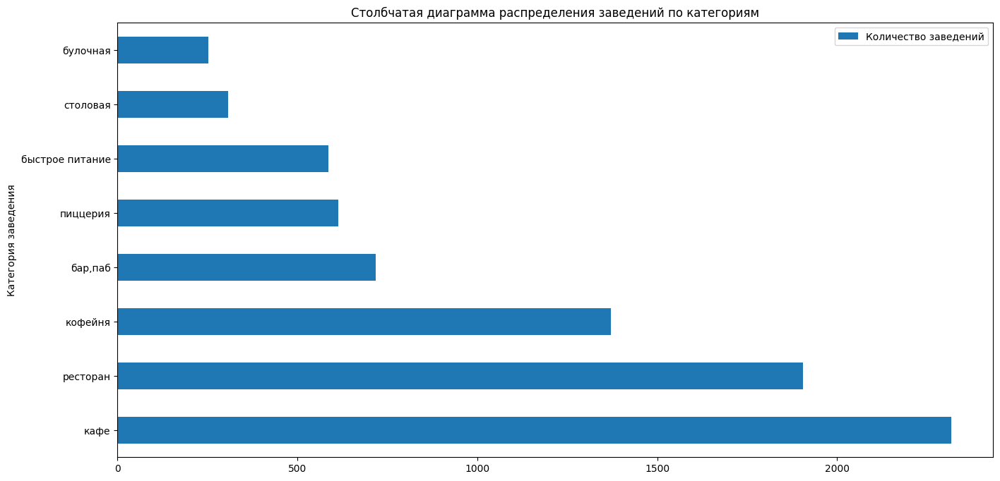

In [37]:
places_category.plot.barh(x='Категория заведения', 
                          y='Количество заведений', 
                          title='Столбчатая диаграмма распределения заведений по категориям',  
                          figsize=(16,8));

Также построим круговую диаграмму и отразим на ней долю заведений каждой категории от их общего числа.

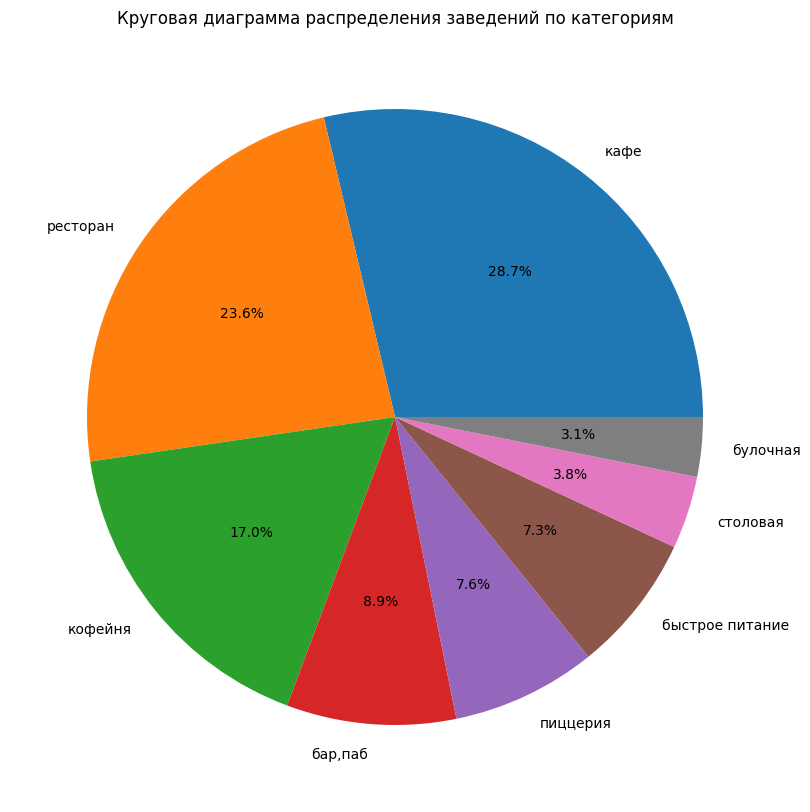

In [38]:
places_category_series = moscow_places['category'].value_counts()
places_category_series.plot(kind='pie', figsize=(10,10), autopct='%1.1f%%')
plt.title('Круговая диаграмма распределения заведений по категориям');
plt.ylabel("");

Заведения общественного питания в Москве по категориям распределены следующим образом:
* больше всего в Москве кафе (более 28%) и ресторанов (почти 24%);
* чуть меньше кофеен (17%);
* далее следуют бары и пабы (чуть меньше 9%), пиццерии (7,6%) и заведения быстрого питания (чуть больше 7%);
* меньше всего столовых (4%) и булочных (3%).

### Количество посадочных мест в заведениях разных категорий

Узнаем медианное количество посадочных мест для каждой из категорий заведений.

In [39]:
category_seats = (moscow_places.pivot_table(index = 'category', 
                                            values = 'seats', 
                                            aggfunc = 'median')
                  .sort_values(by='seats')
                  .reset_index()
                  .rename(columns={'category':'Категория заведения','seats':'Медианное количество посадочных мест'})
                 )
category_seats['Медианное количество посадочных мест'] = round(category_seats['Медианное количество посадочных мест'])
category_seats

,Категория заведения,Медианное количество посадочных мест
0,булочная,48.0
1,пиццерия,50.0
2,кафе,55.0
3,быстрое питание,60.0
4,кофейня,70.0
5,столовая,72.0
6,"бар,паб",78.0
7,ресторан,80.0


Построим визуализацию.

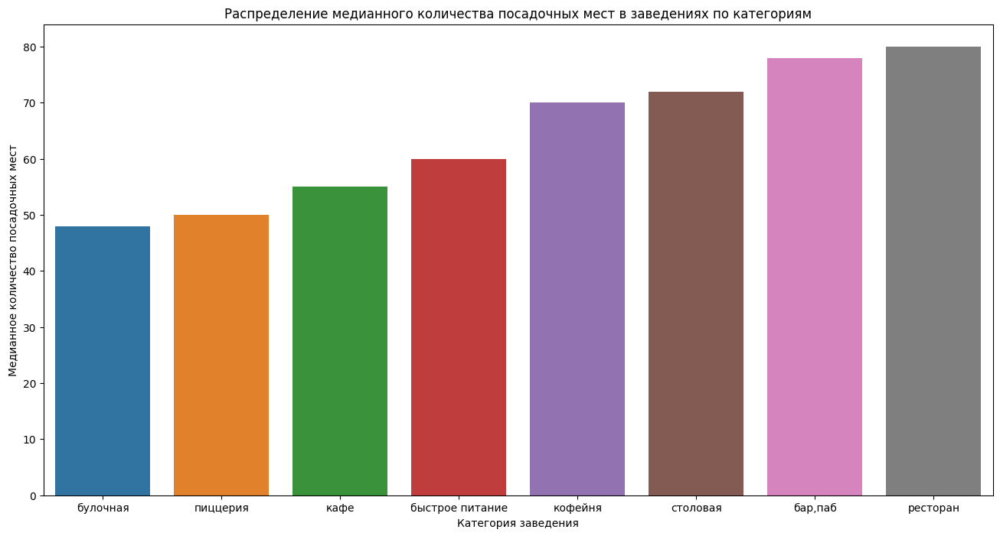

In [40]:
plt.figure(figsize=(16, 8))
plt.title ('Распределение медианного количества посадочных мест в заведениях по категориям')
sns.barplot(data = category_seats, x = 'Категория заведения', y = 'Медианное количество посадочных мест');

В среднем для всех категорий заведений медианное число посадочных мест находится в диапазоне от 48 до 80. Меньше всего посадочных мест в заведениях, рассчитанных на кратковременное пребывание посетителей и их частую смену - булочных, пиццериях, заведениях быстрого питания и кафе. Заведения, рассчитанные на более долгое пребывания посетителей - бары, пабы, кофейни, столовые и рестораны, имеют в среднем большее число посадочных мест.

### Сетевые и несетевые заведения

Рассчитаем количество сетевых и несетевых заведений.

In [41]:
print('Количество сетевых заведений:', moscow_places[moscow_places['chain']==1]['name'].count())
print('Количество несетевых заведений:', moscow_places[moscow_places['chain']==0]['name'].count())

Количество сетевых заведений: 3086
Количество несетевых заведений: 4987


Построим круговую диаграмму и отразим на ней долю сетевых и несетевых заведений.

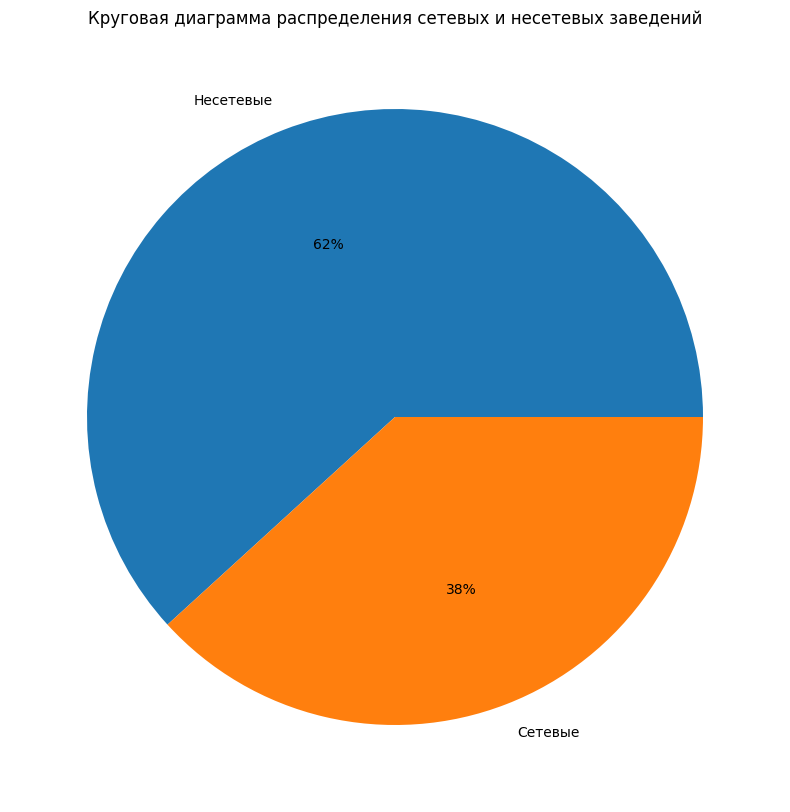

In [42]:
moscow_places.groupby('chain')['name'].count().plot(kind = 'pie', 
                                                    labels = ['Несетевые', 'Сетевые'], 
                                                    autopct='%1.0f%%', 
                                                    figsize = (10,10)
                                                   )
plt.title('Круговая диаграмма распределения сетевых и несетевых заведений');
plt.ylabel("");

Сетевых заведений меньше, чем несетевых (38% против 62%).

Проанализируем соотношение сетевых и несетевых заведений в разрезе по категориям, построив столбчатую диаграмму.

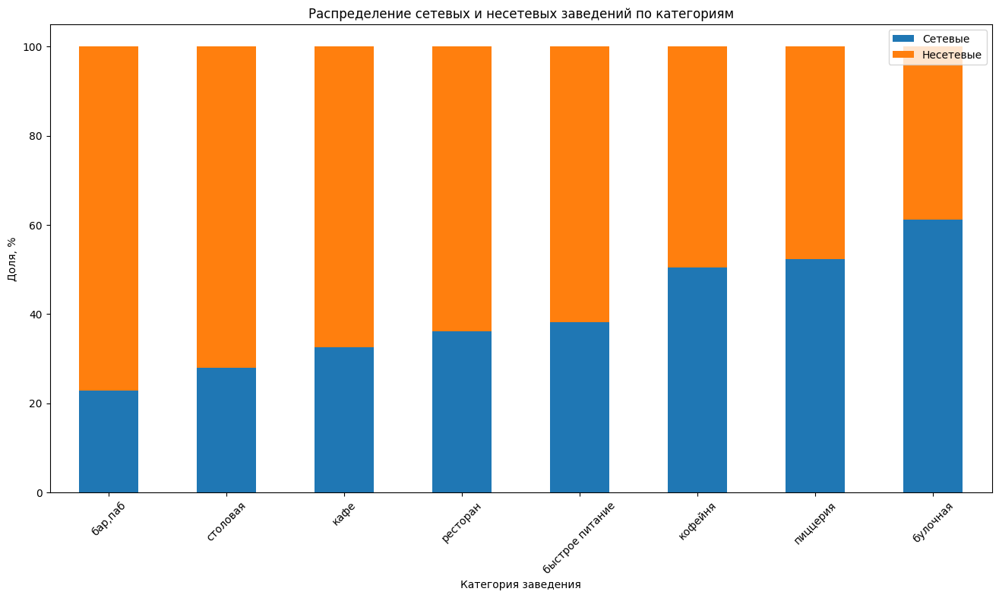

In [43]:
category_chain = moscow_places.pivot_table(index = 'category', columns = 'chain', values = 'name', aggfunc = 'count')
category_chain.columns = ['non_chain', 'chain']
category_chain['chain_rate'] = round(category_chain['chain']/(category_chain['non_chain']+category_chain['chain'])*100,1)
category_chain['non_chain_rate'] = round(category_chain['non_chain']/(category_chain['non_chain']+category_chain['chain'])*100
                                         ,1)
category_chain = category_chain.drop(columns=['non_chain', 'chain'])
category_chain.columns = ['Сетевые', 'Несетевые']
category_chain = category_chain.sort_values(by='Сетевые')

category_chain.plot(kind = 'bar', 
                    stacked = True, 
                    title='Распределение сетевых и несетевых заведений по категориям', 
                    figsize = (16,8),
                    rot = 45
                   );
plt.xlabel('Категория заведения');
plt.ylabel('Доля, %');

По столбчатой диаграмме можно сделать выводы:
* у большей части категорий заведения несетевого типа преобладают; 
* у булочных, пицерий и кофеен ситуация обратная: сетевых заведений больше, чем несетевых; 
* самый низкий процент сетевых заведений у баров и пабов, а самый высокий - у булочных.

### Топ-15 популярных сетевых заведений

Найдем топ-15 самых популярных сетевых заведений по их количеству.

In [44]:
top_15 = (moscow_places[moscow_places['chain']==1]
 .pivot_table(index='name',values='address',aggfunc='count')
 .sort_values(by='address',ascending=False)
 .head(15)
 .reset_index()
 .rename(columns={'name':'Название заведения','address':'Количество заведений'})
)
top_15

,Название заведения,Количество заведений
0,шоколадница,115
1,домино'с пицца,76
2,додо пицца,72
3,one price coffee,68
4,яндекс лавка,67
5,cofix,63
6,prime,47
7,хинкальная,44
8,кофепорт,40
9,кулинарная лавка братьев караваевых,38


Визуализируем топ-15 сетевых заведений.

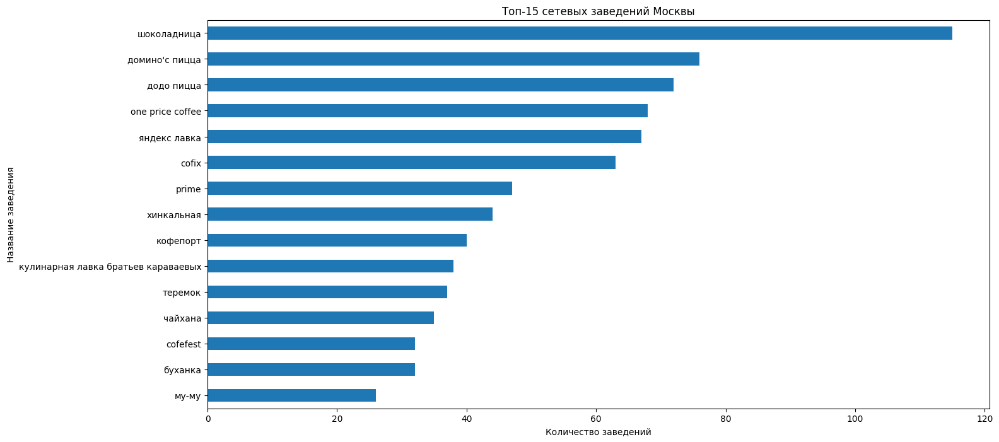

In [45]:
top_15.sort_values(by='Количество заведений').plot.barh(x='Название заведения', 
                                                        y='Количество заведений', 
                                                        title='Топ-15 сетевых заведений Москвы',  
                                                        figsize=(16,8),
                                                        legend=False
                                                       );
plt.xlabel('Количество заведений');

Узнаем, какие категории заведений преобладают в топ-15.

In [46]:
top_15 = (moscow_places[moscow_places['chain']==1]
          .groupby('name')[['name', 'address']].count()
          .sort_values(by = 'address', ascending = False)
          .head(15)
         )
top_15.columns = ['count', 'address']
top_15 = top_15.reset_index().drop(columns = ['address'], axis = 1)
top_15_category = (moscow_places[moscow_places['chain']==1]
                   .groupby('name')[['name','category']].first()
                   .drop(columns = ['name'])
                   .reset_index()
                  )
top_15 = top_15.merge(top_15_category, on = 'name', how = 'left')
top_15.columns = ['Название заведения', 'Количество заведений','Категория заведения']
top_15

,Название заведения,Количество заведений,Категория заведения
0,шоколадница,115,кофейня
1,домино'с пицца,76,пиццерия
2,додо пицца,72,пиццерия
3,one price coffee,68,кофейня
4,яндекс лавка,67,ресторан
5,cofix,63,кофейня
6,prime,47,ресторан
7,хинкальная,44,быстрое питание
8,кофепорт,40,кофейня
9,кулинарная лавка братьев караваевых,38,кафе


Построим столбчатую диаграмму и отразим количество заведений из топ-15 сетей Москвы в каждой категории.

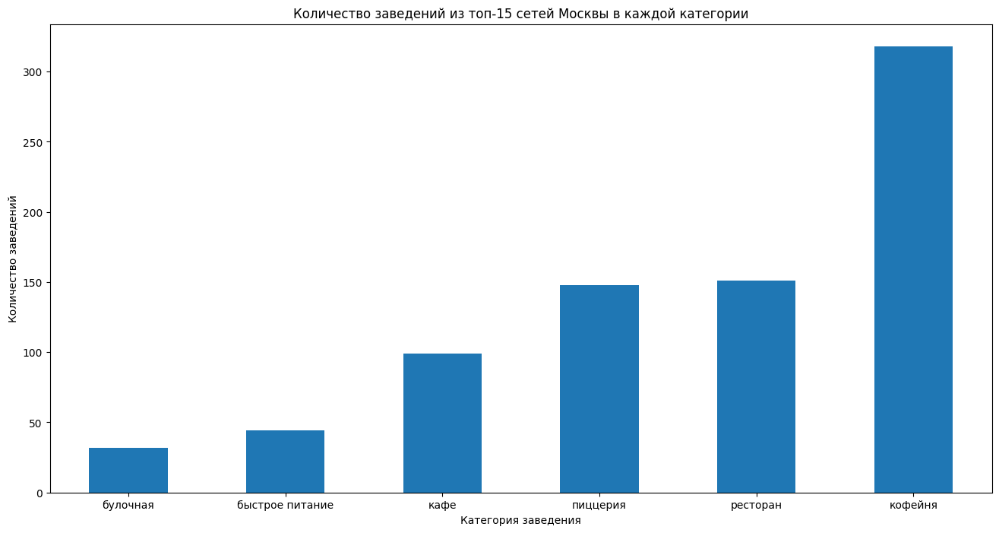

In [47]:
(top_15
 .groupby('Категория заведения')['Количество заведений'].sum()
 .sort_values()
 .plot(kind = 'bar', x = 'category', figsize = (16,8), rot = 0)
)
plt.title('Количество заведений из топ-15 сетей Москвы в каждой категории');
plt.ylabel('Количество заведений');

В топ-15 сетей Москвы с большим отрывом преобладают кофейни, а бары, пабы и столовые вообще не представлены.

### Распределение заведений по районам

Построим сводную таблицу с распределением заведений различных категорий по районам.

In [48]:
district_category = (moscow_places
                     .rename(columns={'category':'Категория заведения','district':'Район'})
                     .pivot_table(index = 'Район', 
                                  columns = 'Категория заведения', 
                                  values = 'address', 
                                  aggfunc = 'count')
                    )
district_category

Категория заведения,"бар,паб",булочная,быстрое питание,кафе,кофейня,пиццерия,ресторан,столовая
Район,,,,,,,,
Восточный административный округ,45,25,69,269,104,72,158,40
Западный административный округ,46,37,62,231,146,69,200,23
Северный административный округ,62,37,55,227,184,69,173,40
Северо-Восточный административный округ,61,28,81,259,156,68,177,39
Северо-Западный административный округ,22,12,30,114,62,40,109,17
Центральный административный округ,341,49,84,444,413,107,598,65
Юго-Восточный административный округ,38,13,67,281,89,55,141,25
Юго-Западный административный округ,38,27,61,236,95,64,166,17
Южный административный округ,65,24,77,257,123,70,183,42


Добавим столбец с общим числом заведений для каждого округа и отсортируем таблицу по нему.

In [49]:
district_category['total'] = (district_category[['бар,паб', 'булочная', 
                                                 'быстрое питание', 'кафе', 
                                                 'кофейня', 'пиццерия', 
                                                 'ресторан', 'столовая']].sum(axis=1)
                              )                             
district_category = district_category.sort_values(by='total')
district_category = district_category.rename(columns={'total':'Всего заведений'})
district_category

Категория заведения,"бар,паб",булочная,быстрое питание,кафе,кофейня,пиццерия,ресторан,столовая,Всего заведений
Район,,,,,,,,,
Северо-Западный административный округ,22,12,30,114,62,40,109,17,406
Юго-Западный административный округ,38,27,61,236,95,64,166,17,704
Юго-Восточный административный округ,38,13,67,281,89,55,141,25,709
Восточный административный округ,45,25,69,269,104,72,158,40,782
Западный административный округ,46,37,62,231,146,69,200,23,814
Южный административный округ,65,24,77,257,123,70,183,42,841
Северный административный округ,62,37,55,227,184,69,173,40,847
Северо-Восточный административный округ,61,28,81,259,156,68,177,39,869
Центральный административный округ,341,49,84,444,413,107,598,65,2101


Визуализируем распределение заведений по районам и категориям.

In [50]:
district_category = district_category.drop(columns = ['Всего заведений'], axis = 1)

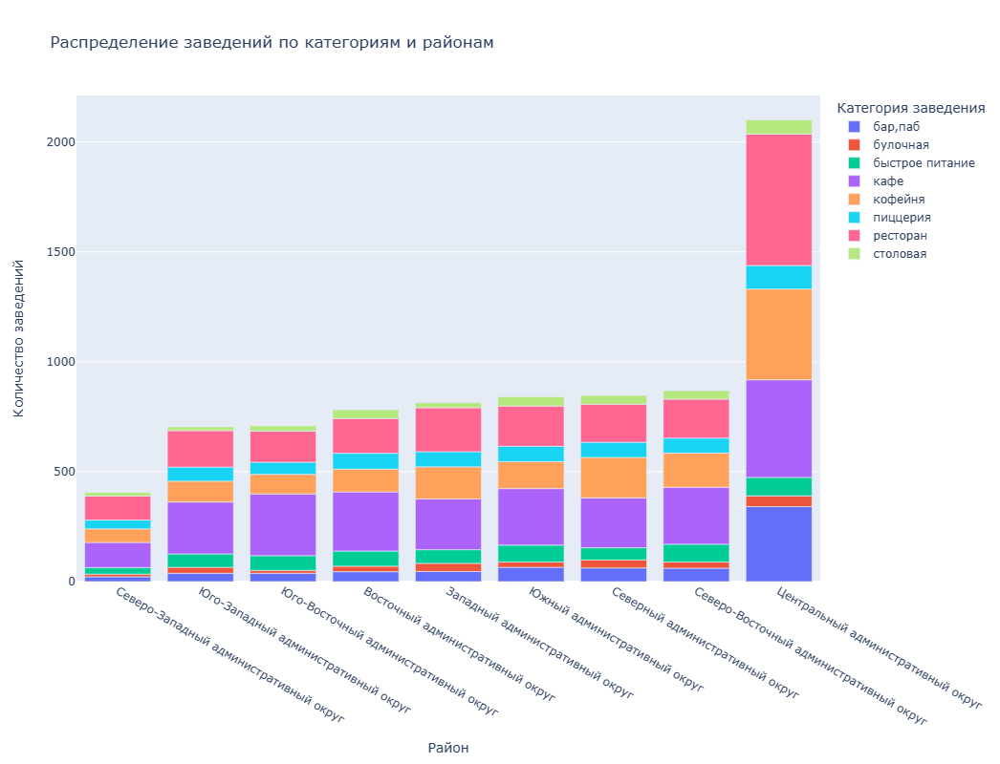

In [51]:
fig = px.bar(district_category, title ="Распределение заведений по категориям и районам", height=800)
fig.update_layout(yaxis_title='Количество заведений')
fig.show()

Можно сделать следующие выводы:
* в ЦАО находится около 2100 заведений, что в несколько раз больше, чем в любом другом из административных округов Москвы;
* в разрезе по категориям заметно, что в ЦАО больше ресторанов, баров-пабов и кофеен, чем в других районах;
* доля столовых в ЦАО напротив, существенно ниже, чем в других районах;
* количество заведений быстрого питания приблизительно одинаковое вне зависимости от района;
* количество заведений в остальных районах (кроме СЗАО) находится приблизительно в одном диапазоне (от 700 до 900);
* меньше всего заведений находится в СЗАО (около 400).

### Распределение средних рейтингов по категориям заведений

Рассчитаем значение среднего рейтинга для каждой категории заведений.

In [52]:
(moscow_places
 .groupby('category')['rating'].mean().round(3)
 .reset_index()
 .rename(columns={'category':'Категория заведения','rating':'Средний рейтинг'})
 .sort_values(by='Средний рейтинг',ascending=False)
 .reset_index(drop=True)
)

,Категория заведения,Средний рейтинг
0,"бар,паб",4.386
1,пиццерия,4.302
2,ресторан,4.283
3,кофейня,4.279
4,булочная,4.265
5,столовая,4.213
6,кафе,4.124
7,быстрое питание,4.046


Построим гистограмму, отражающую средний рейтинг заведений по категориям.

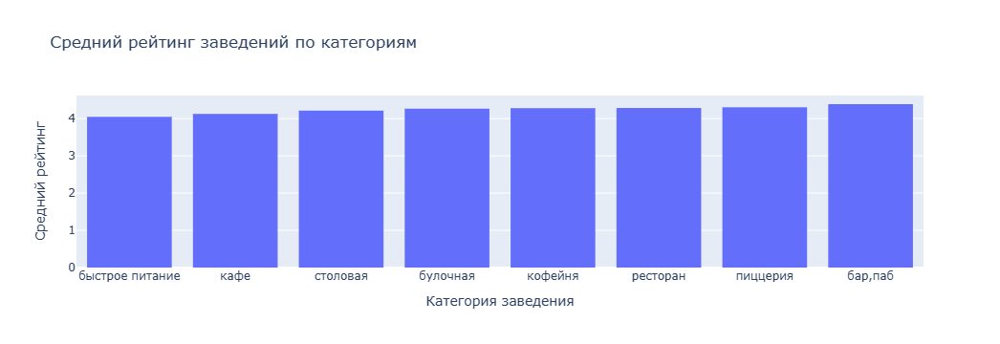

In [53]:
fig2 = px.histogram(moscow_places.groupby('category')['rating'].mean().reset_index().sort_values(by='rating'), 
                    x="category", y = 'rating', title = 'Средний рейтинг заведений по категориям')
fig2.update_layout(yaxis_title='Средний рейтинг', xaxis_title='Категория заведения')
fig2.show()

Гистограмма показывает, что значения среднего рейтинга не сильно отличаются у категорий заведений и находятся в диапазоне от 4 до 4,4. Наименьшее значение среднего рейтинга у заведений быстрого питания, а наибольшее - у баров,пабов.

### Распределение средних рейтингов по районам

Рассчитаем средний рейтинг заведений по районам.

In [54]:
(moscow_places
 .groupby('district')['rating'].mean().round(2)
 .reset_index()
 .sort_values(by ='rating', ascending = False)
 .rename(columns={'district':'Район','rating':'Средний рейтинг'})
 .reset_index(drop=True)
)

,Район,Средний рейтинг
0,Центральный административный округ,4.37
1,Северный административный округ,4.24
2,Северо-Западный административный округ,4.21
3,Западный административный округ,4.18
4,Южный административный округ,4.18
5,Восточный административный округ,4.17
6,Юго-Западный административный округ,4.17
7,Северо-Восточный административный округ,4.15
8,Юго-Восточный административный округ,4.10


Загрузим карту Москвы.

In [55]:
moscow_districts = 'admin_level_geomap.geojson'
moscow_lat, moscow_lng = 55.751244, 37.618423

Создадим карту Москвы.

In [56]:
m1 = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

Построим фоновую картограмму с помощью конструктора Choropleth и добавим её на созданную карту.

In [57]:
Choropleth(
    geo_data=moscow_districts,
    data=moscow_places.groupby('district')['rating'].mean().reset_index(),
    columns=['district', 'rating'],
    key_on='feature.name',
    fill_color='Greens',
    fill_opacity=0.8,
    legend_name='Средний рейтинг заведений по районам',
).add_to(m1)
m1

Можно сделать выводы:
* наиболее высокий средний рейтинг у заведений в ЦАО - почти 4.4;
* затем следуют заведения в САО и СЗАО - средний рейтинг заведений там превышает отметку в 4.2;
* далее располагаются ЮЗАО, ЗАО, ЮАО, ВАО и СВАО со средними рейтингами в диапазоне между 4.2 и 4.1;
* самый низкий показатель рейтингов у заведений в ЮВАО - 4.1.

### Кластеры заведений

Создадим пустой кластер.

In [58]:
m2 = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
marker_cluster = MarkerCluster().add_to(m2)

Напишем функцию create_clusters, которая создаёт маркер в текущей точке и добавляет его в кластер marker_cluster.

In [59]:
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)

Применим функцию create_clusters() к каждой строке таблицы и выведем карту.

In [60]:
moscow_places.apply(create_clusters, axis=1)
m2

### Топ-15 улиц по количеству заведений

Создадим таблицу top15_street и сохраним в нее данные о 15 улицах с наибольшим числом заведений.

In [61]:
top15_street = (moscow_places
                .groupby('street')['name'].count()
                .sort_values(ascending = False)
                .head(15)
                .reset_index()
                .rename(columns={'street':'Название улицы','name':'Количество заведений'})
               )
top15_street

,Название улицы,Количество заведений
0,проспект Мира,181
1,Профсоюзная улица,122
2,Ленинский проспект,100
3,проспект Вернадского,97
4,Варшавское шоссе,73
5,Дмитровское шоссе,70
6,Ленинградское шоссе,68
7,Ленинградский проспект,68
8,Каширское шоссе,66
9,МКАД,65


Построим сводную таблицу с распределением заведений различных категорий по улицам из топ-15.

In [62]:
top_streets = top15_street['Название улицы'].tolist()
street_category = (moscow_places.query('street in @top_streets')
                   .rename(columns={'category':'Категория заведения','street':'Название улицы'})
                   .pivot_table(index = 'Название улицы', 
                                columns = 'Категория заведения', 
                                values = 'address', 
                                aggfunc = 'count')
                  )
street_category['total'] = street_category[['бар,паб', 'булочная', 
                                            'быстрое питание', 'кафе', 
                                            'кофейня', 'пиццерия', 
                                            'ресторан', 'столовая']].sum(axis=1)

street_category = street_category.sort_values(by='total')
street_category = street_category.rename(columns={'total':'Всего заведений'})
street_category

Категория заведения,"бар,паб",булочная,быстрое питание,кафе,кофейня,пиццерия,ресторан,столовая,Всего заведений
Название улицы,,,,,,,,,
проспект Андропова,2.0,NaN,3.0,12.0,6.0,3.0,15.0,1.0,42.0
Алтуфьевское шоссе,4.0,1.0,5.0,12.0,9.0,3.0,9.0,1.0,44.0
Кутузовский проспект,2.0,1.0,2.0,14.0,13.0,2.0,11.0,2.0,47.0
улица Миклухо-Маклая,3.0,NaN,4.0,20.0,4.0,2.0,14.0,NaN,47.0
Люблинская улица,5.0,NaN,5.0,26.0,11.0,1.0,10.0,2.0,60.0
МКАД,1.0,NaN,9.0,45.0,4.0,NaN,5.0,1.0,65.0
Каширское шоссе,2.0,NaN,8.0,18.0,13.0,4.0,16.0,5.0,66.0
Ленинградский проспект,13.0,3.0,2.0,7.0,18.0,6.0,17.0,2.0,68.0
Ленинградское шоссе,5.0,2.0,5.0,13.0,13.0,3.0,24.0,3.0,68.0


Визуализируем распределение заведений по топ-15 улицам и категориям.

In [63]:
street_category = street_category.drop(columns = ['Всего заведений'], axis = 1)

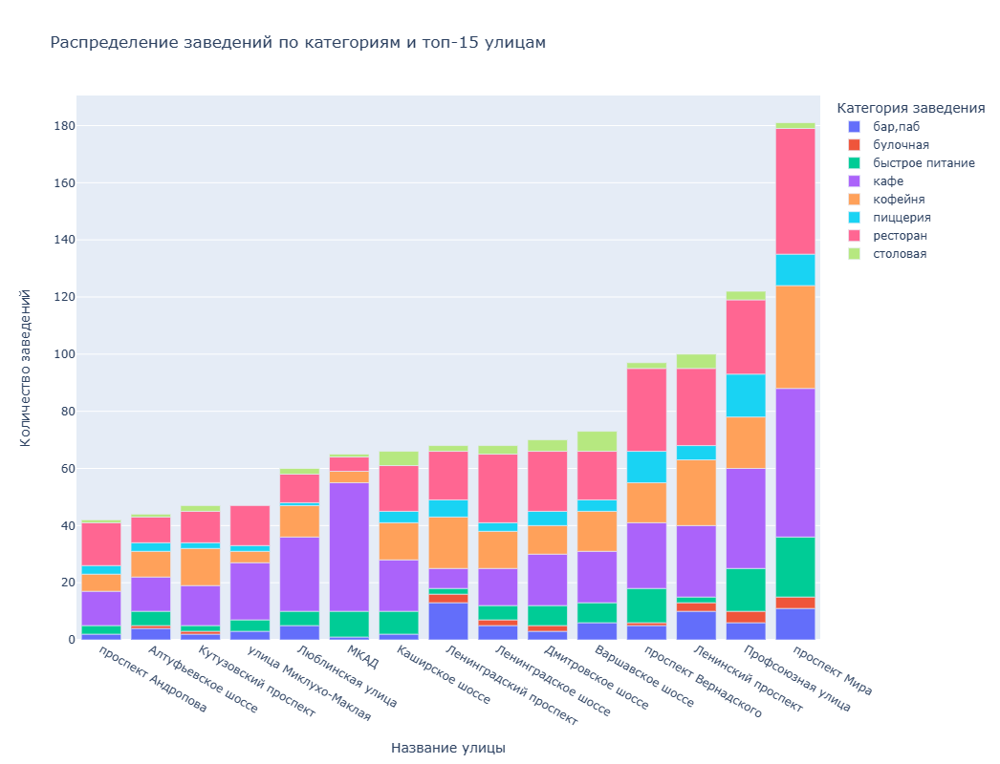

In [64]:
fig3 = px.bar(street_category, title ="Распределение заведений по категориям и топ-15 улицам", height=800)
fig3.update_layout(yaxis_title='Количество заведений')
fig3.show()

Можно сделать выводы:
* самыми популярными на практически всех рассматриваемых улицах стали кафе и рестораны;
* на некоторых из улиц в принципе отсутствуют заведения определенной категории:
   * на МКАДе нет булочных и пиццерий;
   * на Варшавском и Каширском шоссе и Люблинской улице нет булочных;
   * на Пятницкой и Вавилова нет столовых;
   * на улице Миклухо-Маклая нет булочных и столовых.
* доля столовых выше на крупных магистралях, шоссе и проспектах, и ниже на небольших улицах;
* доля кофеен существенно ниже среднего на МКАДе и улице Миклухо-Маклая.

Найдем улицы, на которых находится только один объект общепита, и создадим таблицу с данными о таких заведениях.

In [65]:
street_count = moscow_places.groupby('street')['name'].count().reset_index()
street_count.columns = ['street', 'count']
lonely_street = street_count[street_count['count']==1]['street'].tolist()
lonely_rests = (moscow_places
                .query('street in @lonely_street')[['name','category','chain']]
                .rename(columns = {'name':'Название заведения','category':'Категория заведения','chain':'Признак сети'}))
lonely_rests.head(10)

,Название заведения,Категория заведения,Признак сети
15,дом обеда,столовая,0
21,7/12,кафе,0
25,в парке вкуснее,кофейня,1
58,coffeekaldi's,кофейня,1
60,чебуречная история,кофейня,1
64,testo мания,кофейня,0
71,cofefest,кофейня,1
73,веранда,ресторан,1
97,жигулевское,"бар,паб",0
103,тетри,быстрое питание,0


Построим диаграмму распределения единственных заведений общепита на улице по категориям.

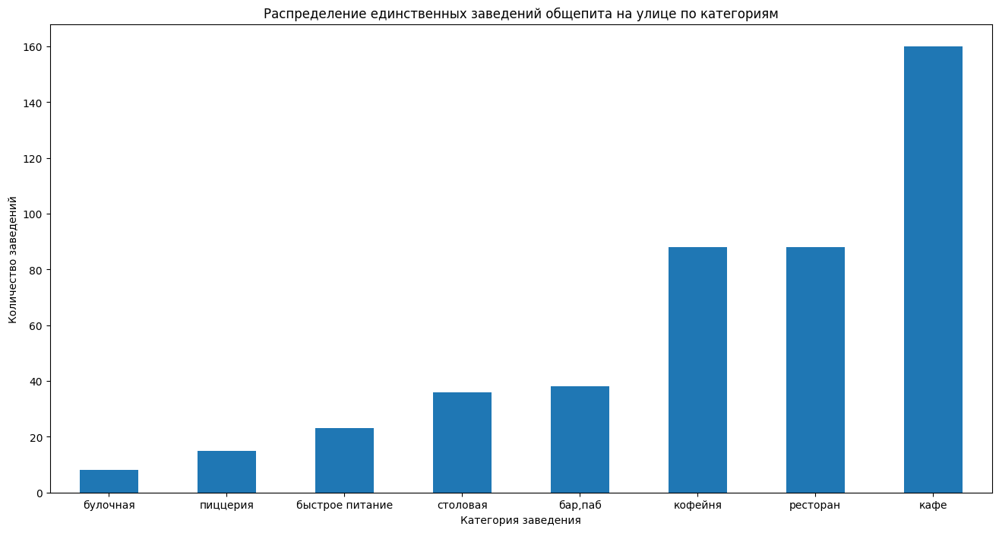

In [66]:
(lonely_rests
 .groupby('Категория заведения')['Название заведения'].count()
 .sort_values()
 .plot(kind = 'bar', figsize = (16,8), rot = 0),
)
plt.title('Распределение единственных заведений общепита на улице по категориям');
plt.ylabel('Количество заведений');

На диаграмме видно, что :
* большая часть таких заведений относятся к категориям кафе, ресторан или кофейня;
* среди таких заведений крайне мало булочных и пиццерий.

Построим круговую диаграмму распределения единственных заведений общепита на улице по принадлежности к сети.

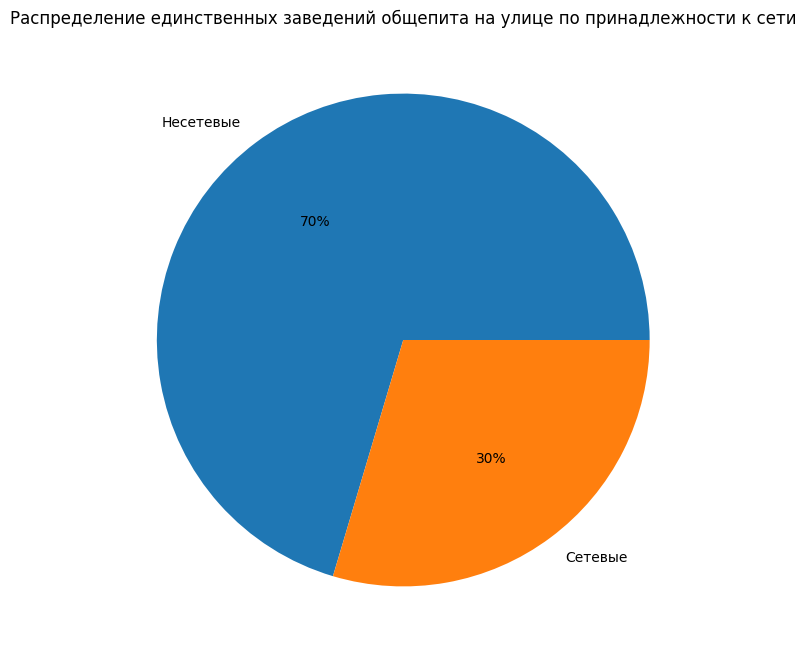

In [67]:
(lonely_rests
 .groupby('Признак сети')['Название заведения'].count()
 .plot(kind = 'pie', figsize = (12,8), autopct='%1.0f%%', labels = ['Несетевые', 'Сетевые'])
)
plt.title('Распределение единственных заведений общепита на улице по принадлежности к сети');
plt.ylabel('');

Большинство единственных заведений общепита на улице являются несетевыми.

### Распределение среднего чека по районам

Рассчитаем медианное значение среднего чека для заведений каждого района.

In [68]:
avg_bill_district = (moscow_places
                     .groupby ('district')['middle_avg_bill'].median()
                     .reset_index()
                     .sort_values (by = 'middle_avg_bill', ascending = False)
                     .reset_index(drop=True)
                     .rename(columns={'district':'Район','middle_avg_bill':'Медиана среднего чека, руб'})
                    )
avg_bill_district

,Район,"Медиана среднего чека, руб"
0,Центральный административный округ,1000.0
1,Западный административный округ,850.0
2,Северо-Западный административный округ,687.5
3,Северный административный округ,627.5
4,Юго-Западный административный округ,600.0
5,Восточный административный округ,525.0
6,Северо-Восточный административный округ,500.0
7,Южный административный округ,500.0
8,Юго-Восточный административный округ,436.5


Построим фоновую картограмму с полученными значениями для каждого района.

In [69]:
m3 = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

Choropleth(
    geo_data=moscow_districts,
    data=avg_bill_district,
    columns=['Район', 'Медиана среднего чека, руб'],
    key_on='feature.name',
    fill_color='Reds',
    fill_opacity=0.8,
    legend_name='Средний чек заведений по районам',
).add_to(m3)

m3

Заметно, что значение среднего чека по районам распределено следующим образом:

* самыми дорогими районами являются ЦАО и ЗАО (средний чак равен 1000 и 850 рублей);
* за ними следуют СЗАО и САО (688 и 628 рублей соответственно);
* далее располагаются ЮЗАО (600 рублей) и ВАО (525 рублей);
* районами с самыми бюджетными заведениями общепита оказались СВАО и ЮАО (500 рублей), а также ЮВАО (437 рублей).

Подведем итоги.

* заведения общественного питания в Москве по категориям распределены следующим образом:
   * больше всего в Москве кафе (более 28%) и ресторанов (почти 24%);
   * чуть меньше кофеен (17%);
   * далее следуют бары и пабы (чуть меньше 9%), пиццерии (7,6%) и заведения быстрого питания (чуть больше 7%);
   * меньше всего столовых (4%) и булочных (3%).
* в среднем для всех категорий заведений медианное число посадочных мест находится в диапазоне от 48 до 80. Меньше всего посадочных мест в заведениях, рассчитанных на кратковременное пребывание посетителей и их частую смену - булочных, пиццериях, заведениях быстрого питания и кафе. Заведения, рассчитанные на более долгое пребывания посетителей - бары, пабы, кофейни, столовые и рестораны, имеют в среднем большее число посадочных мест;
* в общем сетевых заведений меньше, чем несетевых (38% против 62%), однако:
   * у булочных, пицерий и кофеен ситуация обратная: сетевых заведений больше, чем несетевых; 
   * у большей части категорий заведения несетевого типа преобладают; 
   * самый низкий процент сетевых заведений у баров и пабов, а самый высокий - у булочных.
* в топ-15 сетей Москвы с большим отрывом преобладают кофейни, а бары, пабы и столовые вообще не представлены;
* заведения распределены по районам так, что:
  * в ЦАО находится около 2100 заведений, что в несколько раз больше, чем в любом другом из административных округов Москвы;
  * в разрезе по категориям заметно, что в ЦАО больше ресторанов, баров-пабов и кофеен, чем в других районах;
  * доля столовых в ЦАО напротив, существенно ниже, чем в других районах;
  * количество заведений быстрого питания приблизительно одинаковое вне зависимости от района;
  * количество заведений в остальных районах (кроме СЗАО) находится приблизительно в одном диапазоне (от 700 до 900);
  * меньше всего заведений находится в СЗАО (около 400). 
* значения среднего рейтинга не сильно отличаются у категорий заведений и находятся в диапазоне от 4 до 4,4. Наименьшее значение среднего рейтинга у заведений быстрого питания, а наибольшее - у баров,пабов, причем:
  * наиболее высокий средний рейтинг у заведений в ЦАО - почти 4.4;
  * затем следуют заведения в САО и СЗАО - средний рейтинг заведений там превышает отметку в 4.2;
  * далее располагаются ЮЗАО, ЗАО, ЮАО, ВАО и СВАО со средними рейтингами в диапазоне между 4.2 и 4.1;
  * самый низкий показатель рейтингов у заведений в ЮВАО - 4.1.
* среди топ-15 улиц по количеству заведений:
  * самыми популярными стали кафе и рестораны;
  * на некоторых из улиц в принципе отсутствуют заведения определенной категории:
    * на МКАДе нет булочных и пиццерий;
    * на Варшавском и Каширском шоссе и Люблинской улице нет булочных;
    * на Пятницкой и Вавилова нет столовых;
    * на улице Миклухо-Маклая нет булочных и столовых.
  * доля столовых выше на крупных магистралях, шоссе и проспектах, и ниже на небольших улицах;
  * доля кофеен существенно ниже среднего на МКАДе и улице Миклухо-Маклая.
* для единственных заведений на улице характерно, что:
  * большая часть таких заведений относятся к категориям кафе, ресторан или кофейня;
  * среди таких заведений крайне мало булочных и пиццерий;
  * большинство единственных заведений общепита на улице являются несетевыми.
* значение среднего чека по районам распределено следующим образом:
  * самыми дорогими районами являются ЦАО и ЗАО (средний чак равен 1000 и 850 рублей);
  * за ними следуют СЗАО и САО (688 и 628 рублей соответственно);
  * далее располагаются ЮЗАО (600 рублей) и ВАО (525 рублей);
  * районами с самыми бюджетными заведениями общепита оказались СВАО и ЮАО (500 рублей), а также ЮВАО (437 рублей).

### Анализ рынка кофеен

Основателям фонда «Shut Up and Take My Money» не даёт покоя успех сериала «Друзья». Их мечта — открыть такую же крутую и доступную, как «Central Perk», кофейню в Москве. Будем считать, что заказчики не боятся конкуренции в этой сфере, ведь кофеен в больших городах уже достаточно. Попробуем определить, осуществима ли мечта клиентов.

Посчитаем количество кофеен в представленных данных.

In [70]:
print('Всего кофеен:', moscow_places[moscow_places['category']=='кофейня']['name'].count())

Всего кофеен: 1372


Рассчитаем количество кофеен в каждом районе Москвы.

In [71]:
coffee = moscow_places[moscow_places['category']=='кофейня']

(coffee
 .groupby('district')['name'].count()
 .reset_index()
 .sort_values(by = 'name', ascending = False)
 .reset_index(drop=True)
 .rename(columns={'district':'Район','name':'Количество кофеен'})
)

,Район,Количество кофеен
0,Центральный административный округ,413
1,Северный административный округ,184
2,Северо-Восточный административный округ,156
3,Западный административный округ,146
4,Южный административный округ,123
5,Восточный административный округ,104
6,Юго-Западный административный округ,95
7,Юго-Восточный административный округ,89
8,Северо-Западный административный округ,62


Отметим на карте все кофейни.

In [72]:
m4 = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

marker_cluster = MarkerCluster().add_to(m4)

coffee.apply(create_clusters, axis=1)

Choropleth(
    geo_data=moscow_districts,
    data=coffee.groupby('district')['name'].count().reset_index(),
    columns=['district', 'name'],
    key_on='feature.name',
    fill_color='Blues',
    fill_opacity=0.8,
    legend_name='Количество кофеен в районе',
).add_to(m4)

m4

Наибольшее число кофеен сосредоточено в ЦАО (413), за ним с большим отрывом следует САО (184). Ощутимо меньше кофеен в СВАО (156), ЗАО (146) и ЮАО (123). Еще меньше кофеен представлено в ВАО (104), ЮЗАО (95) и ЮВАО (89), а наименьшее количество кофеен в СЗАО - всего 62 кофейни.

Кофейни чаще всего расположены вдоль основных магистралей, проспектов и улиц, а также в торговых и деловых центрах.

Проверим, есть ли в представленных данных круглосуточные кофейни.

In [73]:
print('Всего круглосуточных кофеен:', coffee[coffee['is_24/7']==True]['name'].count())

Всего круглосуточных кофеен: 57


Построим круговую диаграмму, отражающую долю круглосуточных кофеен.

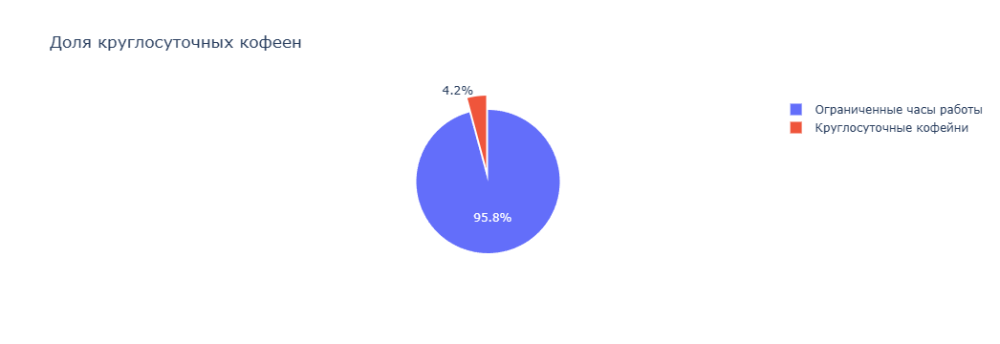

In [74]:
labels = ['Круглосуточные кофейни', 'Ограниченные часы работы'] 
values = [coffee[coffee['is_24/7']==True]['name'].count(), coffee[coffee['is_24/7']==False]['name'].count()]

fig = go.Figure(data=[go.Pie(labels=labels, values=values, pull=[0.2, 0])])
fig.update_layout(title_text="Доля круглосуточных кофеен")
fig.show() 

Круглосуточных кофеен намного меньше, чем кофеен, имеющих ограниченные часы работы.

Узнаем, какие у кофеен рейтинги.

Построим гистограмму распределения рейтинга кофеен.

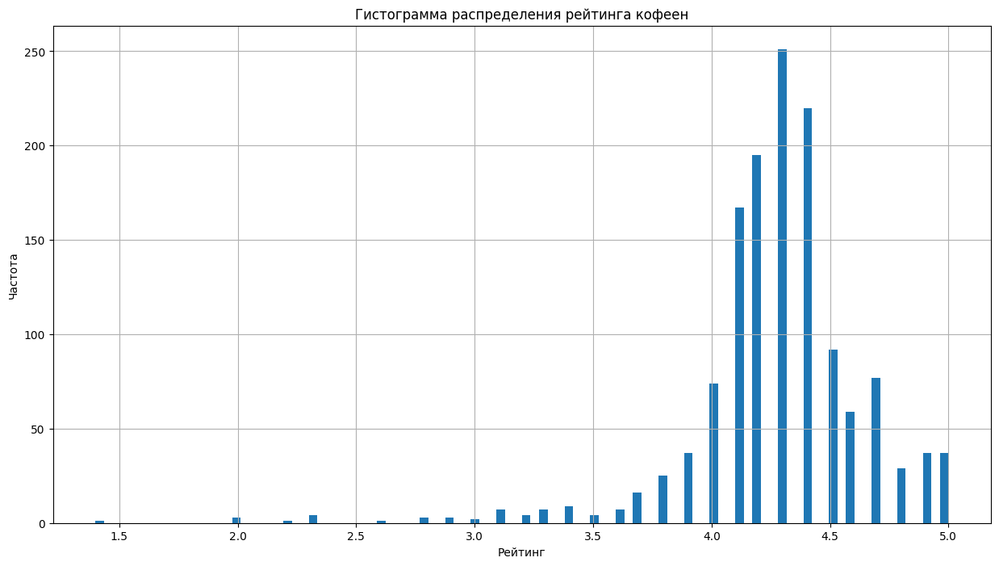

In [75]:
coffee['rating'].hist(bins=100,figsize=(15,8));
plt.xlabel('Рейтинг');
plt.ylabel('Частота');
plt.title('Гистограмма распределения рейтинга кофеен');

Построим диаграмму размаха рейтинга кофеен и получим статистическое описание его распределения.

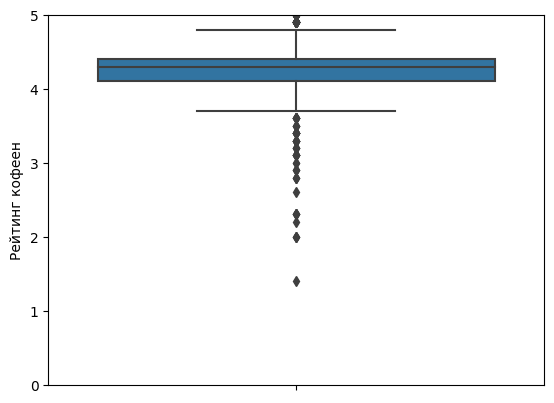

In [76]:
fig = sns.boxplot(y=coffee['rating'])
fig.set(ylim=(0,5));
plt.ylabel('Рейтинг кофеен');

In [77]:
coffee['rating'].describe()

count    1372.000000
mean        4.278571
std         0.375771
min         1.400000
25%         4.100000
50%         4.300000
75%         4.400000
max         5.000000
Name: rating, dtype: float64

Средний и медианный рейтинг кофеен - 4.3 (что является достаточно высоким показателем), причем стандартное отклонение невелико по сравнению с медианным значением рейтинга, иначе говоря - у большинства кофеен высокий показатель рейтинга.

Теперь узнаем, как распределён рейтинг кофеен по районам.

In [78]:
(coffee
 .groupby('district')['rating'].mean().round(2)
 .reset_index()
 .sort_values(by = 'rating', ascending = False)
 .reset_index(drop=True)
 .rename(columns={'district':'Район','rating':'Среднее значение рейтинга'})
)

,Район,Среднее значение рейтинга
0,Центральный административный округ,4.34
1,Северо-Западный административный округ,4.33
2,Северный административный округ,4.30
3,Юго-Западный административный округ,4.29
4,Восточный административный округ,4.28
5,Юго-Восточный административный округ,4.23
6,Южный административный округ,4.23
7,Северо-Восточный административный округ,4.22
8,Западный административный округ,4.19


Отметим на карте среднее значение рейтинга кофеен для районов.

In [79]:
m5 = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

Choropleth(
    geo_data=moscow_districts,
    data=coffee.groupby('district')['rating'].mean().reset_index(),
    columns=['district', 'rating'],
    key_on='feature.name',
    fill_color='PuRd',
    fill_opacity=0.7,
    legend_name='Средний рейтинг кофеен по районам',
).add_to(m5)

m5

Можно сделать выводы:
* самые высокие рейтинги у кофеен в ЦАО и СЗАО (средний рейтинг равен 4.34 и 4.33 соответственно);
* чуть ниже средний рейтинг кофеен в САО (4.3);
* далее следуют ЮЗАО и ВАО (4.29 и 4.28 соответственно);
* за ними расположились ЮАО и ЮВАО (4.23);
* замыкают рейтинг СВАО (4.22) и ЗАО (4.19).

Исследуем распределение стоимости чашки капучино.

Построим гистограмму.

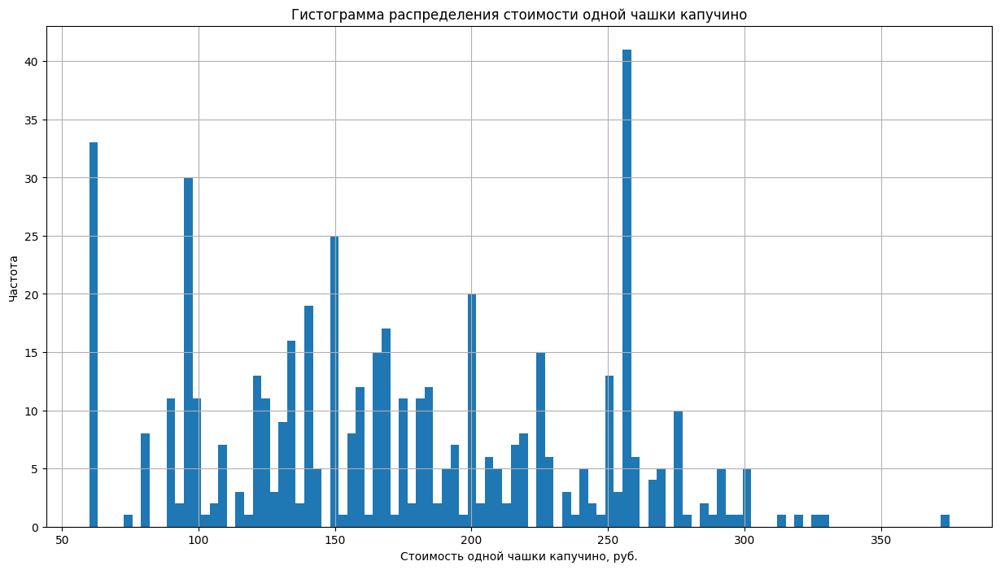

In [80]:
coffee['middle_coffee_cup'].hist(bins=100,figsize=(15,8));
plt.xlabel('Стоимость одной чашки капучино, руб.');
plt.ylabel('Частота');
plt.title('Гистограмма распределения стоимости одной чашки капучино');

Построим диаграмму размаха и получим статистическое описание распределения.

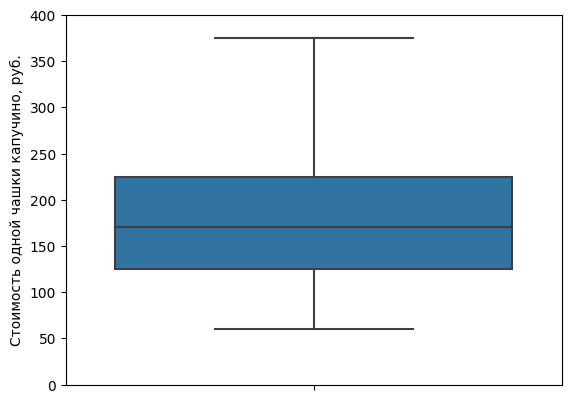

In [81]:
fig = sns.boxplot(y=coffee['middle_coffee_cup'])
fig.set(ylim=(0,400));
plt.ylabel('Стоимость одной чашки капучино, руб.');

In [82]:
coffee['middle_coffee_cup'].describe()

count    505.000000
mean     173.017822
std       66.007137
min       60.000000
25%      125.000000
50%      170.000000
75%      225.000000
max      375.000000
Name: middle_coffee_cup, dtype: float64

Заметен широкий диапазон цен: от 60 до 375 рублей за чашку капучино. При этом медианное и среднее значения практически не отличаются и составляют около 170 рублей за чашку капучино.

Теперь узнаем среднюю стоимость чашки капучино по районам.

In [83]:
(coffee
 .groupby('district')['middle_coffee_cup'].mean().round(1)
 .reset_index()
 .sort_values(by='middle_coffee_cup', ascending = False)
 .reset_index(drop=True)
 .rename(columns={'district':'Район','middle_coffee_cup':'Средняя цена одной чашки капучино, руб.'})
)

,Район,"Средняя цена одной чашки капучино, руб."
0,Западный административный округ,188.6
1,Центральный административный округ,187.6
2,Юго-Западный административный округ,184.2
3,Северный административный округ,168.1
4,Северо-Восточный административный округ,167.8
5,Северо-Западный административный округ,165.5
6,Южный административный округ,157.2
7,Юго-Восточный административный округ,151.1
8,Восточный административный округ,142.9


Отметим на карте среднюю цену одной чашки капучино для кофеен районов Москвы.

In [84]:
m6 = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

Choropleth(
    geo_data=moscow_districts,
    data=coffee.groupby('district')['middle_coffee_cup'].mean().reset_index(),
    columns=['district', 'middle_coffee_cup'],
    key_on='feature.name',
    fill_color='GnBu',
    fill_opacity=0.7,
    legend_name='Средняя стоимость чашки капучино по районам',
).add_to(m6)

m6

Средняя стоимость чашки капучино различается в зависимости от района. Так, дороже всего кофе обойдется в ЦАО, ЮЗАО и ЗАО (в среднем 185 рублей), чуть дешевле в САО, СВАО и СЗАО (примерно 165 рублей), еще дешевле в ЮАО и ЮВАО (155 рублей), а самый низкий показатель в ВАО (около 140 рублей).

## Общий вывод и рекомендации

Перед анализом данные были исследованы на статистические выбросы и предобработаны с внесением следующих изменений:
* удалено три заведения-дубликата по названию и адресу;
* удалены заведения с оценкой среднего чека больше 3000 рублей или равных 0;
* для заведения Шоколадница, располагающегося по адресу Москва, Большая Семёновская улица, 27, корп. 1, число с оценкой одной чашки капучино и строка, которая хранит среднюю стоимость заказа в виде диапазона, заменены на корректные;
* удалены заведения, в которых количество посадочных мест превосходит 300;

В ходе исследовательского анализа данных были получены следующие результаты:
* заведения общественного питания в Москве по категориям распределены следующим образом:
   * больше всего в Москве кафе (более 28%) и ресторанов (почти 24%);
   * чуть меньше кофеен (17%);
   * далее следуют бары и пабы (чуть меньше 9%), пиццерии (7,6%) и заведения быстрого питания (чуть больше 7%);
   * меньше всего столовых (4%) и булочных (3%).
* в среднем для всех категорий заведений медианное число посадочных мест находится в диапазоне от 48 до 80. Меньше всего посадочных мест в заведениях, рассчитанных на кратковременное пребывание посетителей и их частую смену - булочных, пиццериях, заведениях быстрого питания и кафе. Заведения, рассчитанные на более долгое пребывания посетителей - бары, пабы, кофейни, столовые и рестораны, имеют в среднем большее число посадочных мест;
* в общем сетевых заведений меньше, чем несетевых (38% против 62%), однако:
   * у булочных, пицерий и кофеен ситуация обратная: сетевых заведений больше, чем несетевых; 
   * у большей части категорий заведения несетевого типа преобладают; 
   * самый низкий процент сетевых заведений у баров и пабов, а самый высокий - у булочных.
* в топ-15 сетей Москвы с большим отрывом преобладают кофейни, а бары, пабы и столовые вообще не представлены;
* заведения распределены по районам так, что:
  * в ЦАО находится около 2100 заведений, что в несколько раз больше, чем в любом другом из административных округов Москвы;
  * в разрезе по категориям заметно, что в ЦАО больше ресторанов, баров-пабов и кофеен, чем в других районах;
  * доля столовых в ЦАО напротив, существенно ниже, чем в других районах;
  * количество заведений быстрого питания приблизительно одинаковое вне зависимости от района;
  * количество заведений в остальных районах (кроме СЗАО) находится приблизительно в одном диапазоне (от 700 до 900);
  * меньше всего заведений находится в СЗАО (около 400). 
* значения среднего рейтинга не сильно отличаются у категорий заведений и находятся в диапазоне от 4 до 4,4. Наименьшее значение среднего рейтинга у заведений быстрого питания, а наибольшее - у баров,пабов, причем:
  * наиболее высокий средний рейтинг у заведений в ЦАО - почти 4.4;
  * затем следуют заведения в САО и СЗАО - средний рейтинг заведений там превышает отметку в 4.2;
  * далее располагаются ЮЗАО, ЗАО, ЮАО, ВАО и СВАО со средними рейтингами в диапазоне между 4.2 и 4.1;
  * самый низкий показатель рейтингов у заведений в ЮВАО - 4.1.
* среди топ-15 улиц по количеству заведений:
  * самыми популярными стали кафе и рестораны;
  * на некоторых из улиц в принципе отсутствуют заведения определенной категории:
    * на МКАДе нет булочных и пиццерий;
    * на Варшавском и Каширском шоссе и Люблинской улице нет булочных;
    * на Пятницкой и Вавилова нет столовых;
    * на улице Миклухо-Маклая нет булочных и столовых.
  * доля столовых выше на крупных магистралях, шоссе и проспектах, и ниже на небольших улицах;
  * доля кофеен существенно ниже среднего на МКАДе и улице Миклухо-Маклая.
* для единственных заведений на улице характерно, что:
  * большая часть таких заведений относятся к категориям кафе, ресторан или кофейня;
  * среди таких заведений крайне мало булочных и пиццерий;
  * большинство единственных заведений общепита на улице являются несетевыми.
* значение среднего чека по районам распределено следующим образом:
  * самыми дорогими районами являются ЦАО и ЗАО (средний чак равен 1000 и 850 рублей);
  * за ними следуют СЗАО и САО (688 и 628 рублей соответственно);
  * далее располагаются ЮЗАО (600 рублей) и ВАО (525 рублей);
  * районами с самыми бюджетными заведениями общепита оказались СВАО и ЮАО (500 рублей), а также ЮВАО (437 рублей).

В результате анализа рынка кофеен были получены следующие выводы:
* наибольшее число кофеен сосредоточено в ЦАО (413), за ним с большим отрывом следует САО (184). Ощутимо меньше кофеен в СВАО (156), ЗАО (146) и ЮАО (123). Еще меньше кофеен представлено в ВАО (104), ЮЗАО (95) и ЮВАО (89), а наименьшее количество кофеен в СЗАО - всего 62 кофейни;
* круглосуточных кофеен намного меньше, чем кофеен, имеющих ограниченные часы работы;
* cредний рейтинг кофеен - 4.3 (что является достаточно высоким показателем), причем у большинства кофеен такой высокий показатель рейтинга;
* средний рейтинг кофеен распределен по районам следующим образом:
  * самые высокие рейтинги у кофеен в ЦАО и СЗАО (средний рейтинг равен 4.34 и 4.33 соответственно);
  * чуть ниже средний рейтинг кофеен в САО (4.3);
  * далее следуют ЮЗАО и ВАО (4.29 и 4.28 соответственно);
  * за ними расположились ЮАО и ЮВАО (4.23);
  * замыкают рейтинг СВАО (4.22) и ЗАО (4.19).
* у одной чашки капучино широкий диапазон цен: от 60 до 375 рублей. При этом среднее значение составляет около 170 рублей;
* cредняя стоимость чашки капучино различается в зависимости от района. Так, дороже всего кофе обойдется в ЦАО, ЮЗАО и ЗАО (в среднем 185 рублей), чуть дешевле в САО, СВАО и СЗАО (примерно 165 рублей), еще дешевле в ЮАО и ЮВАО (155 рублей), а самый низкий показатель в ВАО (около 140 рублей).

Рекомендуется для открытия кофейни выбрать Северо-Западный административный округ, так как:
* в этом районе не так много кофеен, как в других районах Москвы и легче будет конкурировать;
* средний чек заведений в данном районе достаточно высокий, что свидетельствует о потенциально более платежеспособных клиентах;
* в СЗАО сетевых кофеен много, поэтому открытие новой кофейни может поспособствовать притоку клиентов, которым эти сети надоели.

**Презентация результатов исследовательского анализа:** https://disk.yandex.ru/i/iPEnYGTdUAOLQQ